# Correlation between Data : Electric Vehicle Accident , Israel 2018-19


Importing the libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import matplotlib.colors as colors
import  matplotlib.cm as cm
import plotly.express as px

import plotly
import plotly.offline as plty
plt.rc('axes', labelsize=14)

from shapely.geometry import Point
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [2]:
df_main = pd.read_csv('/Users/divyabisht/Desktop/electricvehicleaccidentbs.csv')
df_main = pd.concat([df_main, pd.to_datetime(df_main['accident_timestamp']).map(lambda x: x.year).rename('Year'),
                pd.to_datetime(df_main['accident_timestamp']).map(lambda x: x.month).rename('Month'),
                pd.to_datetime(df_main['accident_timestamp']).map(lambda x: 1).rename('Day')], axis=1)
df_main

,accident_id,provider_and_id,provider_code,file_type_police,involved_type,involved_type_hebrew,license_acquiring_date,age_group,age_group_hebrew,sex,...,seats,total_weight,total_weight_hebrew,vehicle_vehicle_type,vehicle_vehicle_type_hebrew,vehicle_damage,vehicle_damage_hebrew,Year,Month,Day
0,2018013760,32018013760,3,3,3,נפגע,0,18,85+,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018,3,1
1,2018013760,32018013760,3,3,1,נהג,0,99,לא ידוע,NaN,...,99.0,NaN,NaN,23.0,אופניים חשמליים,4.0,אין נזק,2018,3,1
2,2018042928,32018042928,3,3,1,נהג,2011,7,30-34,2.0,...,2.0,1.0,עד 1.9,1.0,רכב נוסעים פרטי,4.0,אין נזק,2018,10,1
3,2018042928,32018042928,3,3,2,נהג נפגע,0,7,30-34,1.0,...,99.0,NaN,NaN,23.0,אופניים חשמליים,1.0,קל,2018,10,1
4,2018078809,32018078809,3,3,2,נהג נפגע,2000,8,35-39,1.0,...,99.0,1.0,עד 1.9,1.0,רכב נוסעים פרטי,4.0,אין נזק,2018,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7902,2018005642,12018005642,1,1,2,נהג נפגע,2010,7,30-34,1.0,...,99.0,NaN,NaN,23.0,אופניים חשמליים,1.0,קל,2018,8,1
7903,2018056690,12018056690,1,1,1,נהג,2003,7,30-34,1.0,...,3.0,2.0,2.0-2.9,2.0,משא עד 3.5 טון - אחוד (טרנזיט),1.0,קל,2018,8,1
7904,2018056690,12018056690,1,1,2,נהג נפגע,0,8,35-39,2.0,...,99.0,NaN,NaN,23.0,אופניים חשמליים,2.0,בינוני,2018,8,1
7905,2018084262,12018084262,1,1,1,נהג,1972,15,70-74,1.0,...,3.0,1.0,עד 1.9,1.0,רכב נוסעים פרטי,1.0,קל,2018,9,1


In [43]:
df_main.describe()

,accident_id,provider_and_id,provider_code,file_type_police,involved_type,license_acquiring_date,age_group,sex,involve_vehicle_type,safety_measures,...,y,engine_volume,manufacturing_year,seats,total_weight,vehicle_vehicle_type,vehicle_damage,Year,Month,Day
count,7.907000e+03,7.907000e+03,7907.000000,7907.000000,7907.000000,7907.000000,7907.000000,7083.000000,7505.000000,7905.000000,...,7906.000000,7505.000000,5140.000000,7505.000000,4609.000000,7505.000000,7389.000000,7907.000000,7907.000000,7907.0
mean,2.018520e+09,2.687371e+10,2.485519,2.512837,1.606804,1010.266220,26.900468,1.112099,14.551366,4.550032,...,661673.754237,2.673284,1186.192607,72.018787,1.141028,14.551366,2.931249,2018.469837,6.516757,1.0
std,5.002365e+05,8.742830e+09,0.874281,0.858540,0.626443,999.072692,36.710342,0.567524,9.759696,1.154251,...,58521.685761,3.567408,989.967194,42.703364,2.251462,9.759696,1.422853,0.499121,3.059171,0.0
min,2.018000e+09,1.201800e+10,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,...,381927.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,2018.000000,1.000000,1.0
25%,2.018048e+09,1.201909e+10,1.000000,3.000000,1.000000,0.000000,6.000000,1.000000,1.000000,5.000000,...,649154.000000,0.000000,0.000000,5.000000,0.000000,1.000000,1.000000,2018.000000,4.000000,1.0
50%,2.018094e+09,3.201806e+10,3.000000,3.000000,2.000000,1963.000000,9.000000,1.000000,21.000000,5.000000,...,663657.000000,0.000000,2007.000000,99.000000,1.000000,21.000000,4.000000,2018.000000,7.000000,1.0
75%,2.019046e+09,3.201903e+10,3.000000,3.000000,2.000000,2000.000000,15.000000,1.000000,23.000000,5.000000,...,672010.750000,6.000000,2014.000000,99.000000,1.000000,23.000000,4.000000,2019.000000,9.000000,1.0
max,2.019100e+09,3.201910e+10,3.000000,3.000000,3.000000,2019.000000,99.000000,2.000000,25.000000,5.000000,...,798194.000000,13.000000,2019.000000,99.000000,17.000000,25.000000,4.000000,2019.000000,12.000000,1.0


In [3]:
Title = " "
def PlotPiechart(labels, values, columnName):
    fig = {
      "data": [
        {
          "labels": labels,
          "values": values['provider_and_id'],
          #"domain": {"x": [0, 1]},
          "name": columnName,
          "hoverinfo":"label+percent+name",
          "hole": .6,
          "type": "pie"
        },
         ],
      "layout": {
           # "title":"Percentage of Accident happened in situations : " + columnName,
            "title":Title,
            "annotations": [
                {
                    "font": {
                        "size": 40
                    },
                    "showarrow": False,
                    "text": " ",
                    "x": 5.50,
                    "y": 0.5
                }
            ]
        }
    }
    plty.iplot(fig)

## Correlation Matrix

A correlation matrix is a table showing correlation coefficients between variables. 
Each cell in the table shows the correlation between two variables. A correlation matrix is used to summarize data, as an input into a more advanced analysis,
and as a diagnostic for advanced analyses.

The measure is best used in variables that demonstrate a linear relationship between each other.

Better Reference : https://towardsdatascience.com/better-heatmaps-and-correlation-matrix-plots-in-python-41445d0f2bec

In [4]:
import plotly.graph_objects as go
import plotly.io as pio

corr = df_main.corr()

X = list(df_main.columns) 
sns_colorscale = [[0.0, '#3f7f93'], #cmap = sns.diverging_palette(220, 10, as_cmap = True)
 [0.071, '#5890a1'],
 [0.143, '#72a1b0'],
 [0.214, '#8cb3bf'],
 [0.286, '#a7c5cf'],
 [0.357, '#c0d6dd'],
 [0.429, '#dae8ec'],
 [0.5, '#f2f2f2'],
 [0.571, '#f7d7d9'],
 [0.643, '#f2bcc0'],
 [0.714, '#eda3a9'],
 [0.786, '#e8888f'],
 [0.857, '#e36e76'],
 [0.929, '#de535e'],
 [1.0, '#d93a46']]

heat = go.Heatmap(z=corr,
                  x=X,
                  y=X,
                  xgap=1, ygap=1,
                  colorscale=sns_colorscale,
                  colorbar_thickness=20,
                  colorbar_ticklen=3
                   )

title = 'Correlation Matrix'               

layout = go.Layout(title_text=title, title_x=0.5, 
                   width=1000, height=1000,
                   xaxis_showgrid=False,
                   yaxis_showgrid=False,
                   yaxis_autorange='reversed')
   
fig=go.Figure(data=[heat], layout=layout)        
fig.show() 

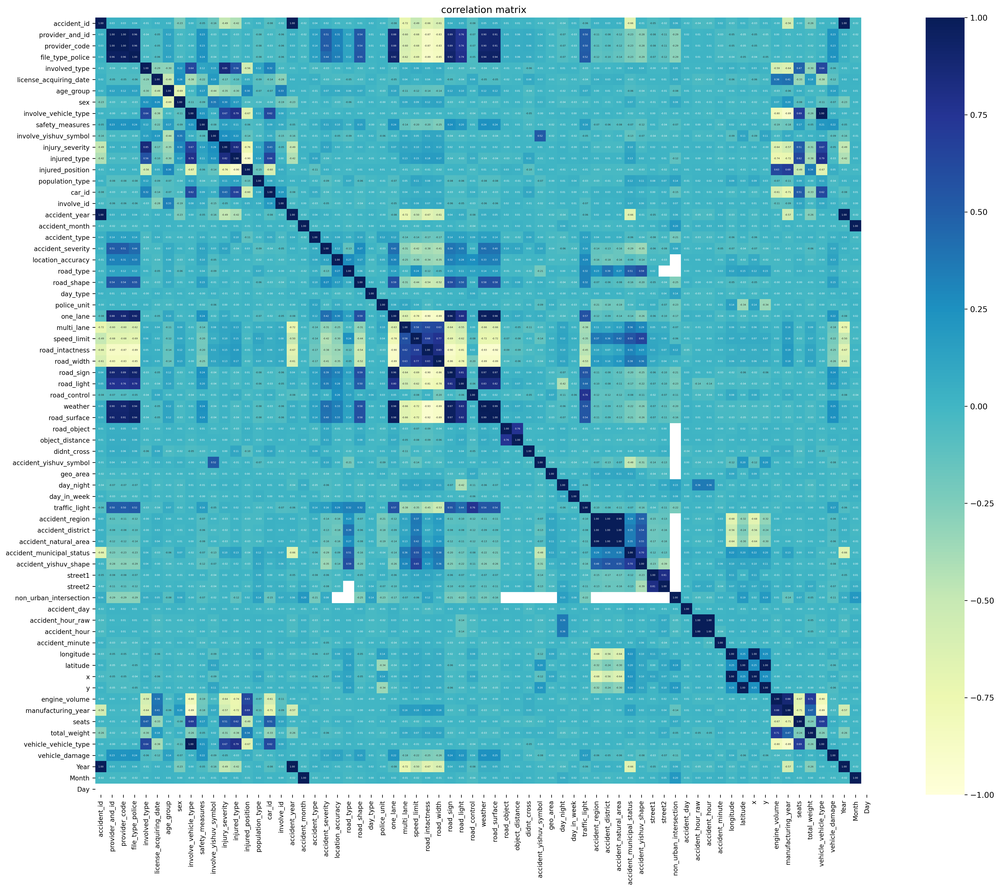

In [6]:
fig, ax = plt.subplots(figsize=(24, 18), dpi=300)
corr = df_main.corr()

hm = sns.heatmap(corr, cbar=True, vmin=-1, vmax=1,
                 fmt='.2f', annot_kws={'size': 3}, annot=True, 
                 square=True, cmap="YlGnBu")

ticks = np.arange(corr.shape[0]) + 0.5
ax.set_xticks(ticks)
ax.set_xticklabels(corr.columns, rotation=90, fontsize=8)
ax.set_yticks(ticks)
ax.set_yticklabels(corr.index, rotation=360, fontsize=8)

ax.set_title('correlation matrix')
#plt.tight_layout()
#plt.savefig("corr_matrix_incl_anno_double.png", dpi=300)
fig.show() 



In [7]:
df_main.corr()

,accident_id,provider_and_id,provider_code,file_type_police,involved_type,license_acquiring_date,age_group,sex,involve_vehicle_type,safety_measures,...,y,engine_volume,manufacturing_year,seats,total_weight,vehicle_vehicle_type,vehicle_damage,Year,Month,Day
accident_id,1.000000,0.034533,0.034476,0.038039,-0.007556,0.021389,0.022191,-0.233318,0.001562,-0.051520,...,0.012228,-0.000020,-0.563913,-0.003046,-0.262731,0.001562,0.001683,0.998339,-0.016031,NaN
provider_and_id,0.034533,1.000000,1.000000,0.964264,-0.043308,-0.053462,0.123681,-0.028205,-0.001242,0.229099,...,-0.046772,0.002886,-0.012676,-0.007770,-0.021330,-0.001242,0.231977,0.034636,-0.019099,NaN
provider_code,0.034476,1.000000,1.000000,0.964264,-0.043307,-0.053464,0.123680,-0.028192,-0.001242,0.229103,...,-0.046773,0.002886,-0.012646,-0.007770,-0.021316,-0.001242,0.231977,0.034579,-0.019098,NaN
file_type_police,0.038039,0.964264,0.964264,1.000000,-0.038708,-0.056568,0.125231,-0.032791,0.004134,0.238050,...,-0.048149,-0.001469,-0.020753,-0.000564,-0.024568,0.004134,0.239332,0.038317,-0.015673,NaN
involved_type,-0.007556,-0.043308,-0.043307,-0.038708,1.000000,-0.290247,-0.302609,0.219450,0.635835,0.118631,...,0.008799,-0.593062,-0.639246,0.469587,-0.304732,0.635835,-0.060905,-0.008203,0.001822,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
vehicle_vehicle_type,0.001562,-0.001242,-0.001242,0.004134,0.635835,-0.382185,-0.016676,-0.105805,1.000000,0.209111,...,-0.013645,-0.804554,-0.892778,0.692056,-0.260068,1.000000,0.035433,0.001425,-0.000614,NaN
vehicle_damage,0.001683,0.231977,0.231977,0.239332,-0.060905,-0.116467,0.144095,-0.074786,0.035433,0.221780,...,-0.058269,-0.037570,-0.032534,0.039117,0.003746,0.035433,1.000000,0.001550,-0.010783,NaN
Year,0.998339,0.034636,0.034579,0.038317,-0.008203,0.020861,0.023221,-0.233867,0.001425,-0.052127,...,0.012921,-0.000622,-0.565265,-0.002890,-0.263912,0.001425,0.001550,1.000000,-0.016216,NaN
Month,-0.016031,-0.019099,-0.019098,-0.015673,0.001822,0.015690,0.009279,0.004781,-0.000614,-0.012265,...,0.025414,-0.007966,0.008642,-0.006407,0.000125,-0.000614,-0.010783,-0.016216,1.000000,NaN


      age_group  sex  accident_hour  day_in_week  accident_district  \
0            18  1.0             14            2                 51   
1             7  2.0              8            4                 31   
2             7  1.0              8            4                 31   
3             8  1.0             14            6                 24   
4            13  1.0             16            1                 24   
...         ...  ...            ...          ...                ...   
6285          7  1.0             13            2                 51   
6286          7  1.0             13            3                 31   
6287          8  2.0             13            3                 31   
6288         15  1.0             19            7                 99   
6289          4  1.0             19            7                 99   

      accident_severity  isTelAviv  
0                     3       True  
1                     3      False  
2                     3      False  

,age_group,sex,accident_hour,day_in_week,accident_district,accident_severity,isTelAviv
age_group,1.000000,0.014583,-0.085804,-0.046339,0.014548,0.007344,0.032385
sex,0.014583,1.000000,-0.027839,-0.041498,-0.006115,0.069606,0.036195
accident_hour,-0.085804,-0.027839,1.000000,0.036931,-0.002482,-0.002357,-0.034494
day_in_week,-0.046339,-0.041498,0.036931,1.000000,0.025378,-0.049039,-0.008396
accident_district,0.014548,-0.006115,-0.002482,0.025378,1.000000,-0.127950,0.204999
accident_severity,0.007344,0.069606,-0.002357,-0.049039,-0.127950,1.000000,0.066490
isTelAviv,0.032385,0.036195,-0.034494,-0.008396,0.204999,0.066490,1.000000


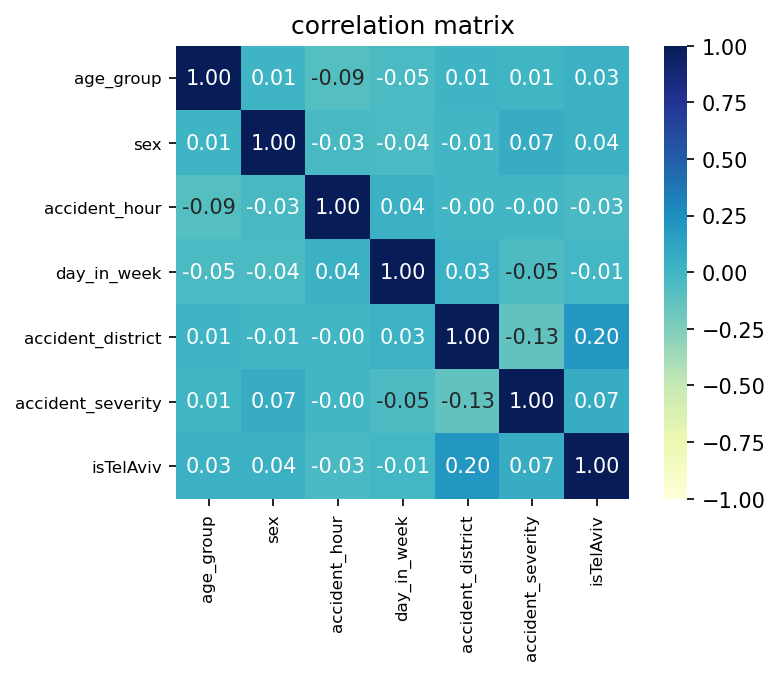

In [5]:
df = df_main[['age_group', 'sex', 'accident_hour', 'day_in_week', 'accident_district', 'accident_severity']] #['accident_region'] == 5
df['isTelAviv'] = (df_main['accident_region'] == 5)
df = df[df['age_group']!=99]

df = df.dropna().reset_index(drop=True)

fig, ax = plt.subplots(figsize=(6, 4), dpi=150)
corr = df.corr()

hm = sns.heatmap(corr, cbar=True, vmin=-1, vmax=1,
                 fmt='.2f', annot_kws={'size': 10}, annot=True, 
                 square=True, cmap="YlGnBu")

ticks = np.arange(corr.shape[0]) + 0.5
ax.set_xticks(ticks)
ax.set_xticklabels(corr.columns, rotation=90, fontsize=8)
ax.set_yticks(ticks)
ax.set_yticklabels(corr.index, rotation=360, fontsize=8)

ax.set_title('correlation matrix')
#plt.tight_layout()
#plt.savefig("corr_matrix_incl_anno_double.png", dpi=300)
fig.show() 

print(df)

df.corr()

Low Correleations

In [6]:
from scipy.stats import pearsonr
import pandas as pd

def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(pearsonr(df[r], df[c])[1], 4)
    return pvalues

calculate_pvalues(df)

,age_group,sex,accident_hour,day_in_week,accident_district,accident_severity,isTelAviv
age_group,0.0,0.2475,0.0,0.0002,0.2486,0.5604,0.0102
sex,0.2475,0.0,0.0272,0.001,0.6278,0.0,0.0041
accident_hour,0.0,0.0272,0.0,0.0034,0.844,0.8517,0.0062
day_in_week,0.0002,0.001,0.0034,0.0,0.0442,0.0001,0.5056
accident_district,0.2486,0.6278,0.844,0.0442,0.0,0.0,0.0
accident_severity,0.5604,0.0,0.8517,0.0001,0.0,0.0,0.0
isTelAviv,0.0102,0.0041,0.0062,0.5056,0.0,0.0,0.0


In [7]:
from scipy.stats import pearsonr
import numpy as np
rho = df.corr().round(2)
pval = df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.01,0.05,0.1] if x<=t]))
rho.astype(str) + p

,age_group,sex,accident_hour,day_in_week,accident_district,accident_severity,isTelAviv
age_group,1.0***,0.01,-0.09***,-0.05***,0.01,0.01,0.03**
sex,0.01,1.0***,-0.03**,-0.04***,-0.01,0.07***,0.04***
accident_hour,-0.09***,-0.03**,1.0***,0.04***,-0.0,-0.0,-0.03***
day_in_week,-0.05***,-0.04***,0.04***,1.0***,0.03**,-0.05***,-0.01
accident_district,0.01,-0.01,-0.0,0.03**,1.0***,-0.13***,0.2***
accident_severity,0.01,0.07***,-0.0,-0.05***,-0.13***,1.0***,0.07***
isTelAviv,0.03**,0.04***,-0.03***,-0.01,0.2***,0.07***,1.0***


### Year and injured severity

In [8]:
df = df_main
df = df[df['Year'] == 2018]
Title = "Injured severity in 2018"
PlotPiechart(df['injury_severity'].values, df, 'Age')
df = df[df['injury_severity'] == 3]
print(len(df.index))

2026


In [9]:
df = df_main
df = df[df['Year'] == 2019]
Title = "Injured severity in 2019"
PlotPiechart(df['injury_severity'].values, df, 'Age')
df = df[df['injury_severity'] == 3]
print(len(df.index))

1805


### Injury Severity
0.0 - Status Unknown

1.0 - dead / הרוג

2.0 - Severly injured / פצוע קשה

3.0 - Slightly injured / פצוע קל


During Year 2019 fatal injuries showed a decrease !

### Year and injured type

In [10]:
df = df_main
df = df[df['Year'] == 2018]
Title = "Injured type in 2018"
PlotPiechart(df['injured_type_hebrew'].values, df, 'Age')
df = df[df['injured_type'] == 1]
print("number of pedestrians injured = {}".format(len(df.index)))

number of pedestrians injured = 215


In [11]:
df = df_main
df = df[df['Year'] == 2019]
Title = "Injured type in 2019"
PlotPiechart(df['injured_type_hebrew'].values, df, 'Age')
df = df[df['injured_type'] == 1]
print("number of pedestrians injured = {}".format(len(df.index)))

number of pedestrians injured = 193


### Total Accident Count

In [12]:
df = df_main[['provider_and_id','Year','Month','Day']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'Year':'first','Month':'first','Day':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Count"})

df = df.set_index(['Year','Month','Day']).sum(level=[0,1,2]).reset_index()
df = df.sort_values(by=['Year','Month','Day']).reset_index(drop=True)
df["Date"] = pd.to_datetime(df[['Year', 'Month', 'Day',]],format='%Y%m%d')
df

,Year,Month,Day,Total Accidents Count,Date
0,2018,1,1,126,2018-01-01
1,2018,2,1,128,2018-02-01
2,2018,3,1,153,2018-03-01
3,2018,4,1,169,2018-04-01
4,2018,5,1,200,2018-05-01
5,2018,6,1,229,2018-06-01
6,2018,7,1,206,2018-07-01
7,2018,8,1,184,2018-08-01
8,2018,9,1,186,2018-09-01
9,2018,10,1,174,2018-10-01


[Text(0, 0, '2018-01'),
 Text(1, 0, '2018-02'),
 Text(2, 0, '2018-03'),
 Text(3, 0, '2018-04'),
 Text(4, 0, '2018-05'),
 Text(5, 0, '2018-06'),
 Text(6, 0, '2018-07'),
 Text(7, 0, '2018-08'),
 Text(8, 0, '2018-09'),
 Text(9, 0, '2018-10'),
 Text(10, 0, '2018-11'),
 Text(11, 0, '2018-12'),
 Text(12, 0, '2019-01'),
 Text(13, 0, '2019-02'),
 Text(14, 0, '2019-03'),
 Text(15, 0, '2019-04'),
 Text(16, 0, '2019-05'),
 Text(17, 0, '2019-06'),
 Text(18, 0, '2019-07'),
 Text(19, 0, '2019-08'),
 Text(20, 0, '2019-09'),
 Text(21, 0, '2019-10'),
 Text(22, 0, '2019-11')]

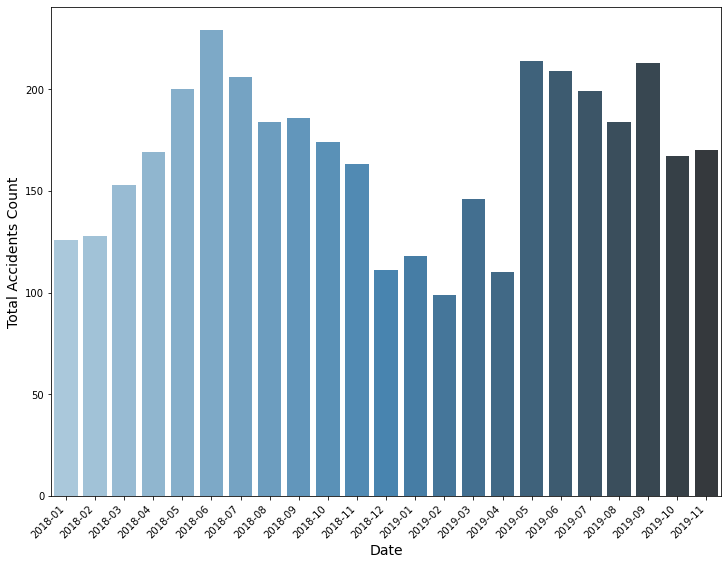

In [104]:
fig, ax = plt.subplots(figsize = (12,9))  
fig = sns.lineplot(x='Date', y='Total Accidents Count', data=df, ax=ax)
fig = sns.barplot(x="Date", y="Total Accidents Count", data = df, 
                  ax=ax, palette="Blues_d")
x_dates = df['Date'].dt.strftime('%Y-%m').sort_values().unique()
ax.set_xticklabels(labels=x_dates, rotation=45, ha='right')

#### Accidents are at high level during summer seasons !
#### During Winter Seasons Accident are at their all time low 

## Inside Tel Aviv

[Text(0, 0, '2018-01'),
 Text(1, 0, '2018-02'),
 Text(2, 0, '2018-03'),
 Text(3, 0, '2018-04'),
 Text(4, 0, '2018-05'),
 Text(5, 0, '2018-06'),
 Text(6, 0, '2018-07'),
 Text(7, 0, '2018-08'),
 Text(8, 0, '2018-09'),
 Text(9, 0, '2018-10'),
 Text(10, 0, '2018-11'),
 Text(11, 0, '2018-12'),
 Text(12, 0, '2019-01'),
 Text(13, 0, '2019-02'),
 Text(14, 0, '2019-03'),
 Text(15, 0, '2019-04'),
 Text(16, 0, '2019-05'),
 Text(17, 0, '2019-06'),
 Text(18, 0, '2019-07'),
 Text(19, 0, '2019-08'),
 Text(20, 0, '2019-09'),
 Text(21, 0, '2019-10'),
 Text(22, 0, '2019-11')]

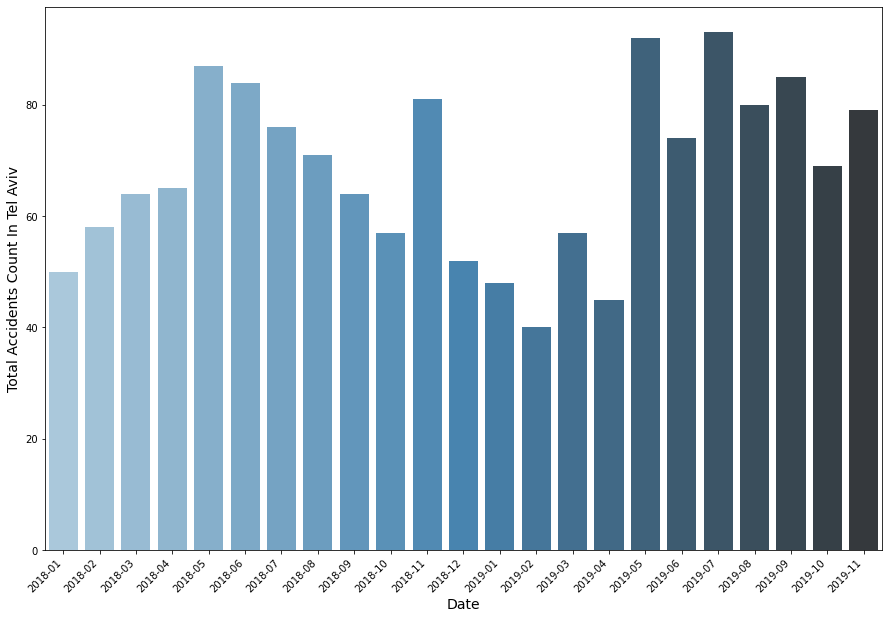

In [36]:
df = df_main[df_main['accident_region'] == 5]
df = df[['provider_and_id','Year','Month','Day']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'Year':'first','Month':'first','Day':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Count In Tel Aviv"})

df = df.set_index(['Year','Month','Day']).sum(level=[0,1,2]).reset_index()
df = df.sort_values(by=['Year','Month','Day']).reset_index(drop=True)
df["Date"] = pd.to_datetime(df[['Year', 'Month', 'Day',]],format='%Y%m%d')

fig, ax = plt.subplots(figsize = (15,10))  
fig = sns.lineplot(x='Date', y='Total Accidents Count In Tel Aviv', data=df, ax=ax)
fig = sns.barplot(x="Date", y="Total Accidents Count In Tel Aviv", data = df, 
                  ax=ax, palette="Blues_d")
x_dates = df['Date'].dt.strftime('%Y-%m').sort_values().unique()
ax.set_xticklabels(labels=x_dates, rotation=45, ha='right')

### Accidents count over time(Month) for females in Tel Aviv

[Text(0, 0, '2018-01'),
 Text(1, 0, '2018-02'),
 Text(2, 0, '2018-03'),
 Text(3, 0, '2018-04'),
 Text(4, 0, '2018-05'),
 Text(5, 0, '2018-06'),
 Text(6, 0, '2018-07'),
 Text(7, 0, '2018-08'),
 Text(8, 0, '2018-09'),
 Text(9, 0, '2018-10'),
 Text(10, 0, '2018-11'),
 Text(11, 0, '2018-12'),
 Text(12, 0, '2019-01'),
 Text(13, 0, '2019-02'),
 Text(14, 0, '2019-03'),
 Text(15, 0, '2019-04'),
 Text(16, 0, '2019-05'),
 Text(17, 0, '2019-06'),
 Text(18, 0, '2019-07'),
 Text(19, 0, '2019-08'),
 Text(20, 0, '2019-09'),
 Text(21, 0, '2019-10'),
 Text(22, 0, '2019-11')]

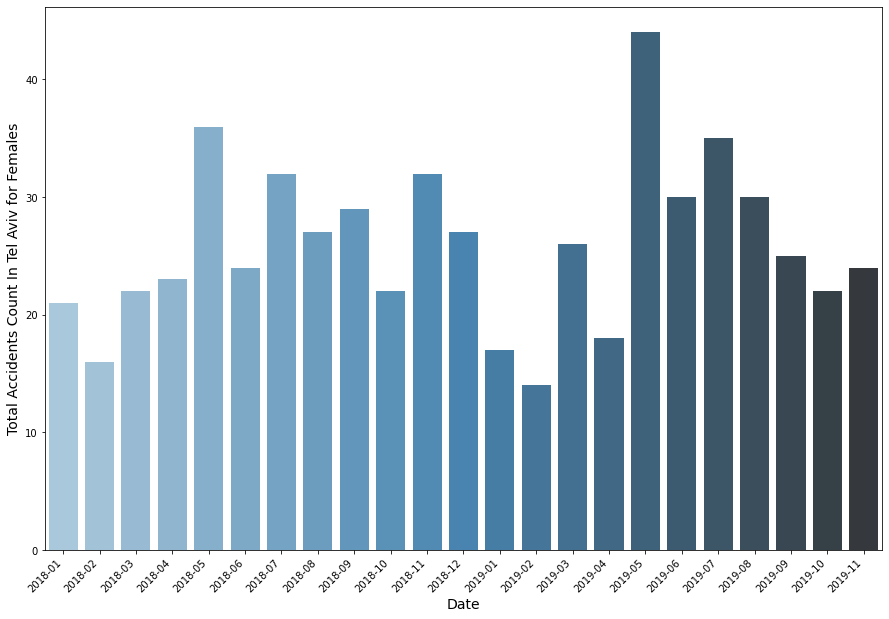

In [35]:
df = df_main[df_main['accident_region'] == 5]
df = df[df['sex'] == 2]
df = df[['provider_and_id','Year','Month','Day']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'Year':'first','Month':'first','Day':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Count In Tel Aviv for Females"})

df = df.set_index(['Year','Month','Day']).sum(level=[0,1,2]).reset_index()
df = df.sort_values(by=['Year','Month','Day']).reset_index(drop=True)
df["Date"] = pd.to_datetime(df[['Year', 'Month', 'Day',]],format='%Y%m%d')

fig, ax = plt.subplots(figsize = (15,10))  
fig = sns.lineplot(x='Date', y='Total Accidents Count In Tel Aviv for Females', data=df, ax=ax)
fig = sns.barplot(x="Date", y="Total Accidents Count In Tel Aviv for Females", data = df, 
                  ax=ax, palette="Blues_d")
x_dates = df['Date'].dt.strftime('%Y-%m').sort_values().unique()
ax.set_xticklabels(labels=x_dates, rotation=45, ha='right')

### Accidents count over time(Month) for males in Tel Aviv

[Text(0, 0, '2018-01'),
 Text(1, 0, '2018-02'),
 Text(2, 0, '2018-03'),
 Text(3, 0, '2018-04'),
 Text(4, 0, '2018-05'),
 Text(5, 0, '2018-06'),
 Text(6, 0, '2018-07'),
 Text(7, 0, '2018-08'),
 Text(8, 0, '2018-09'),
 Text(9, 0, '2018-10'),
 Text(10, 0, '2018-11'),
 Text(11, 0, '2018-12'),
 Text(12, 0, '2019-01'),
 Text(13, 0, '2019-02'),
 Text(14, 0, '2019-03'),
 Text(15, 0, '2019-04'),
 Text(16, 0, '2019-05'),
 Text(17, 0, '2019-06'),
 Text(18, 0, '2019-07'),
 Text(19, 0, '2019-08'),
 Text(20, 0, '2019-09'),
 Text(21, 0, '2019-10'),
 Text(22, 0, '2019-11')]

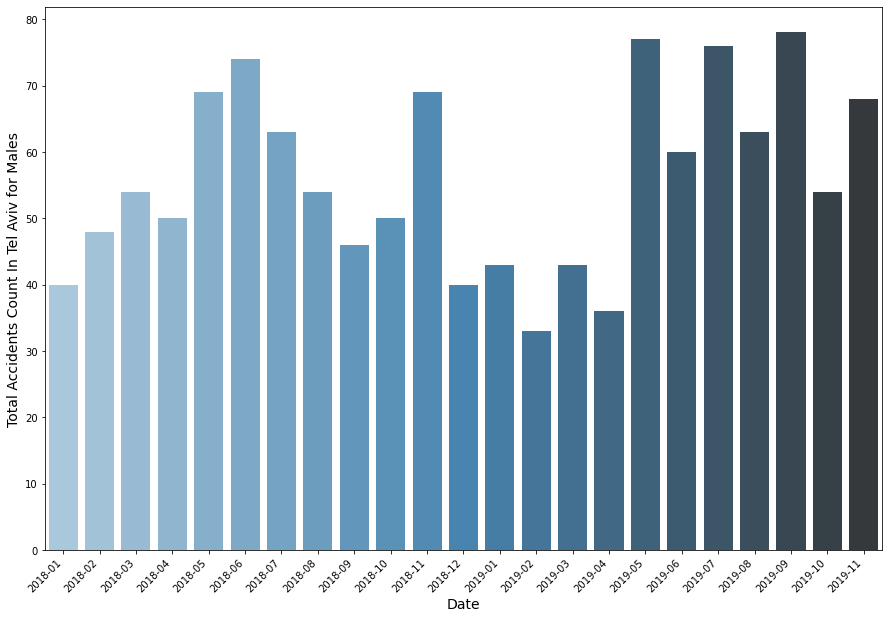

In [34]:
df = df_main[df_main['accident_region'] == 5]
df = df[df['sex'] == 1]
df = df[['provider_and_id','Year','Month','Day']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'Year':'first','Month':'first','Day':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Count In Tel Aviv for Males"})

df = df.set_index(['Year','Month','Day']).sum(level=[0,1,2]).reset_index()
df = df.sort_values(by=['Year','Month','Day']).reset_index(drop=True)
df["Date"] = pd.to_datetime(df[['Year', 'Month', 'Day',]],format='%Y%m%d')

fig, ax = plt.subplots(figsize = (15,10))  
fig = sns.lineplot(x='Date', y='Total Accidents Count In Tel Aviv for Males', data=df, ax=ax)
fig = sns.barplot(x="Date", y="Total Accidents Count In Tel Aviv for Males", data = df, 
                  ax=ax, palette="Blues_d")
x_dates = df['Date'].dt.strftime('%Y-%m').sort_values().unique()
ax.set_xticklabels(labels=x_dates, rotation=45, ha='right')

### Accidents count over time(Hourly) for females in Tel Aviv

[Text(0, 0, '0'),
 Text(1, 0, '1'),
 Text(2, 0, '2'),
 Text(3, 0, '3'),
 Text(4, 0, '4'),
 Text(5, 0, '5'),
 Text(6, 0, '6'),
 Text(7, 0, '7'),
 Text(8, 0, '8'),
 Text(9, 0, '9'),
 Text(10, 0, '10'),
 Text(11, 0, '11'),
 Text(12, 0, '12'),
 Text(13, 0, '13'),
 Text(14, 0, '14'),
 Text(15, 0, '15'),
 Text(16, 0, '16'),
 Text(17, 0, '17'),
 Text(18, 0, '18'),
 Text(19, 0, '19'),
 Text(20, 0, '20'),
 Text(21, 0, '21'),
 Text(22, 0, '22'),
 Text(23, 0, '23')]

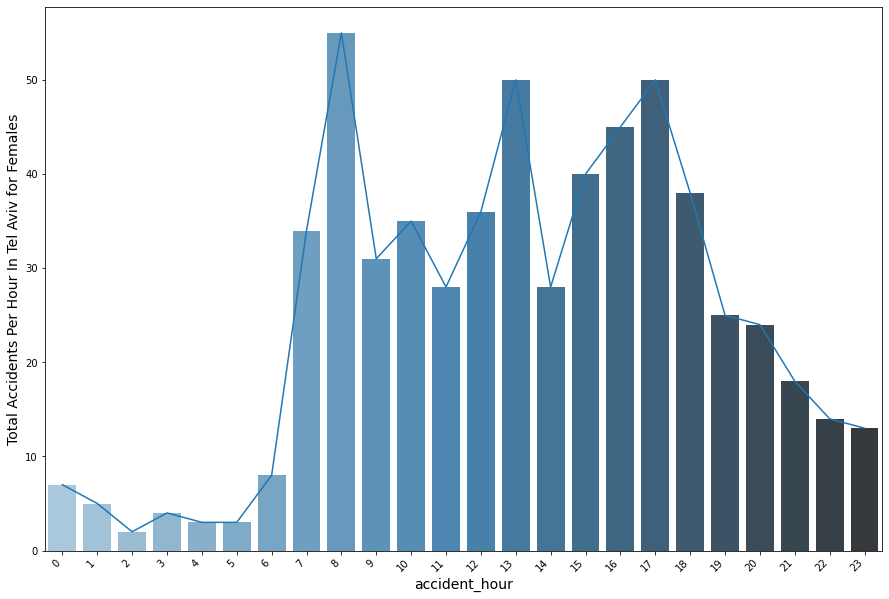

In [55]:
df = df_main[df_main['accident_region'] == 5] # Tel Aviv
df = df[df['sex'] == 2] # Females
df = df[['provider_and_id','accident_hour']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'accident_hour':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Per Hour In Tel Aviv for Females"})

df = df.set_index(['accident_hour']).sum(level=[0]).reset_index()
df = df.sort_values(by=['accident_hour']).reset_index(drop=True)

fig, ax = plt.subplots(figsize = (15,10))  
fig = sns.lineplot(x='accident_hour', y='Total Accidents Per Hour In Tel Aviv for Females', data=df, ax=ax)
fig = sns.barplot(x="accident_hour", y="Total Accidents Per Hour In Tel Aviv for Females", data = df, 
                  ax=ax, palette="Blues_d")
x_dates = df['accident_hour'].sort_values().unique()
ax.set_xticklabels(labels=x_dates, rotation=45, ha='right')

### Accidents count over time(Hourly) for males in Tel Aviv

[Text(0, 0, '0'),
 Text(1, 0, '1'),
 Text(2, 0, '2'),
 Text(3, 0, '3'),
 Text(4, 0, '4'),
 Text(5, 0, '5'),
 Text(6, 0, '6'),
 Text(7, 0, '7'),
 Text(8, 0, '8'),
 Text(9, 0, '9'),
 Text(10, 0, '10'),
 Text(11, 0, '11'),
 Text(12, 0, '12'),
 Text(13, 0, '13'),
 Text(14, 0, '14'),
 Text(15, 0, '15'),
 Text(16, 0, '16'),
 Text(17, 0, '17'),
 Text(18, 0, '18'),
 Text(19, 0, '19'),
 Text(20, 0, '20'),
 Text(21, 0, '21'),
 Text(22, 0, '22'),
 Text(23, 0, '23')]

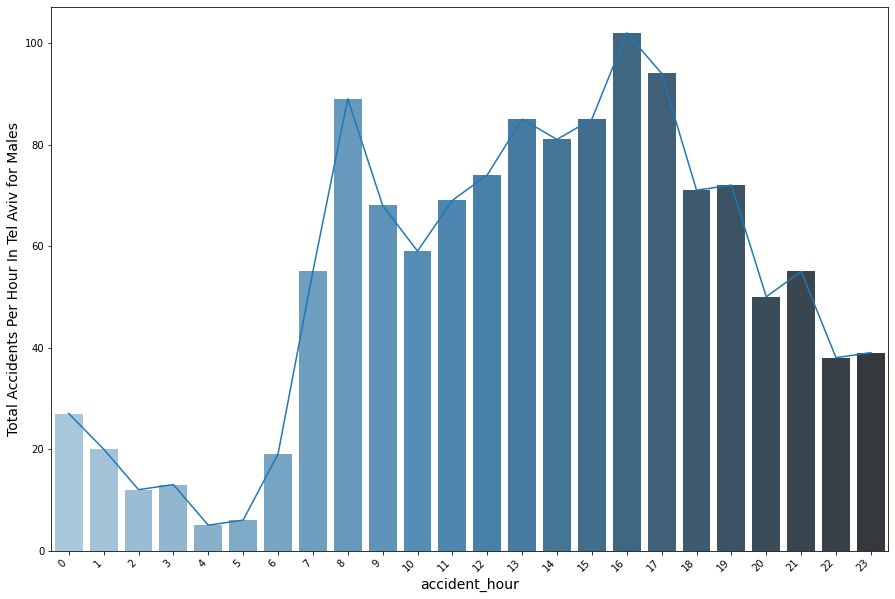

In [58]:
df = df_main[df_main['accident_region'] == 5] # Tel Aviv
df = df[df['sex'] == 1] # Males
df = df[['provider_and_id','accident_hour']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'accident_hour':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Per Hour In Tel Aviv for Males"})

df = df.set_index(['accident_hour']).sum(level=[0]).reset_index()
df = df.sort_values(by=['accident_hour']).reset_index(drop=True)

fig, ax = plt.subplots(figsize = (15,10))  
fig = sns.lineplot(x='accident_hour', y='Total Accidents Per Hour In Tel Aviv for Males', data=df, ax=ax)
fig = sns.barplot(x="accident_hour", y="Total Accidents Per Hour In Tel Aviv for Males", data = df, 
                  ax=ax, palette="Blues_d")
x_dates = df['accident_hour'].sort_values().unique()
ax.set_xticklabels(labels=x_dates, rotation=45, ha='right')

### Maximum Accidents occurs during ofice hours !

8 am usually maximum accident occurs

### Age

In [13]:
# age by gender
df = df_main[df_main['accident_region'] == 5] # Tel Aviv

# we take only accidents with full gender data
indecies = df['sex_hebrew'].isna()
p_and_id = df[indecies]['provider_and_id'].to_numpy()
df_gender = df[df['provider_and_id'].map(lambda x: x not in p_and_id)]

df1 = df_gender[df_gender['sex'] == 1] # male
Title = "Age of male"
PlotPiechart(df1['age_group_hebrew'].values, df1, 'Age')

df2 = df_gender[df_gender['sex'] == 2] # female
Title = "Age of female"
PlotPiechart(df2['age_group_hebrew'].values, df2, 'Age')

Young Adults are more involved in Accidents !

In [60]:
# age by gender
df = df_main[df_main['accident_region'] == 5] # Tel Aviv

# we take only accidents with full gender data
indecies = df['sex_hebrew'].isna()
p_and_id = df[indecies]['provider_and_id'].to_numpy()
df_gender = df[df['provider_and_id'].map(lambda x: x not in p_and_id)]

df1 = df_gender[df_gender['sex'] == 1] # male
df_male_age = df1['age_group'].values

# age by gender
df = df_main[df_main['accident_region'] == 5] # Tel Aviv

# we take only accidents with full gender data
indecies = df['sex_hebrew'].isna()
p_and_id = df[indecies]['provider_and_id'].to_numpy()
df_gender = df[df['provider_and_id'].map(lambda x: x not in p_and_id)]

df1 = df_gender[df_gender['sex'] == 2] # female
df_female_age = df1['age_group'].values

from scipy.stats import ttest_ind

male_mean = np.mean(df_male_age)
female_mean = np.mean(df_female_age)
print("male mean value:",male_mean)
print("female mean value:",female_mean)
male_std = np.std(df_male_age)
female_std = np.std(df_female_age)
print("man std value:",male_std)
print("female std value:",female_std)
ttest,pval = ttest_ind(df_male_age,df_female_age)
print("p-value",pval)
if pval <0.05:
  print("we reject null hypothesis")
else:
  print("we accept null hypothesis")

male mean value: 8.989544436146378
female mean value: 8.123142250530785
man std value: 5.589508844951088
female std value: 3.4081386759552283
p-value 0.0015942335410290042
we reject null hypothesis


## Outside of Tel Aviv

### All Accidents count over time

[Text(0, 0, '2018-01'),
 Text(1, 0, '2018-02'),
 Text(2, 0, '2018-03'),
 Text(3, 0, '2018-04'),
 Text(4, 0, '2018-05'),
 Text(5, 0, '2018-06'),
 Text(6, 0, '2018-07'),
 Text(7, 0, '2018-08'),
 Text(8, 0, '2018-09'),
 Text(9, 0, '2018-10'),
 Text(10, 0, '2018-11'),
 Text(11, 0, '2018-12'),
 Text(12, 0, '2019-01'),
 Text(13, 0, '2019-02'),
 Text(14, 0, '2019-03'),
 Text(15, 0, '2019-04'),
 Text(16, 0, '2019-05'),
 Text(17, 0, '2019-06'),
 Text(18, 0, '2019-07'),
 Text(19, 0, '2019-08'),
 Text(20, 0, '2019-09'),
 Text(21, 0, '2019-10'),
 Text(22, 0, '2019-11')]

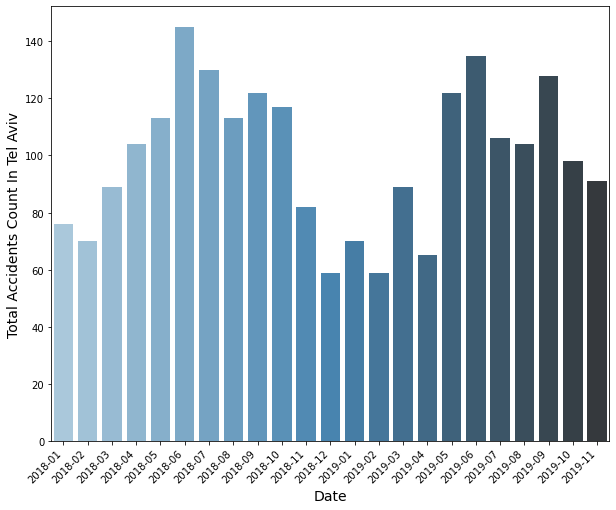

In [64]:
df = df_main[df_main['accident_region'] != 5]
df = df[['provider_and_id','Year','Month','Day']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'Year':'first','Month':'first','Day':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Count In Tel Aviv"})

df = df.set_index(['Year','Month','Day']).sum(level=[0,1,2]).reset_index()
df = df.sort_values(by=['Year','Month','Day']).reset_index(drop=True)
df["Date"] = pd.to_datetime(df[['Year', 'Month', 'Day',]],format='%Y%m%d')

fig, ax = plt.subplots(figsize = (10,8))
fig = sns.lineplot(x='Date', y='Total Accidents Count In Tel Aviv', data=df, ax=ax)
fig = sns.barplot(x="Date", y="Total Accidents Count In Tel Aviv", data = df,
                  ax=ax, palette="Blues_d")
x_dates = df['Date'].dt.strftime('%Y-%m').sort_values().unique()
ax.set_xticklabels(labels=x_dates, rotation=45, ha='right')

### Accidents count over time(Month) for females Outside Tel Aviv

[Text(0, 0, '2018-01'),
 Text(1, 0, '2018-02'),
 Text(2, 0, '2018-03'),
 Text(3, 0, '2018-04'),
 Text(4, 0, '2018-05'),
 Text(5, 0, '2018-06'),
 Text(6, 0, '2018-07'),
 Text(7, 0, '2018-08'),
 Text(8, 0, '2018-09'),
 Text(9, 0, '2018-10'),
 Text(10, 0, '2018-11'),
 Text(11, 0, '2018-12'),
 Text(12, 0, '2019-01'),
 Text(13, 0, '2019-02'),
 Text(14, 0, '2019-03'),
 Text(15, 0, '2019-04'),
 Text(16, 0, '2019-05'),
 Text(17, 0, '2019-06'),
 Text(18, 0, '2019-07'),
 Text(19, 0, '2019-08'),
 Text(20, 0, '2019-09'),
 Text(21, 0, '2019-10'),
 Text(22, 0, '2019-11')]

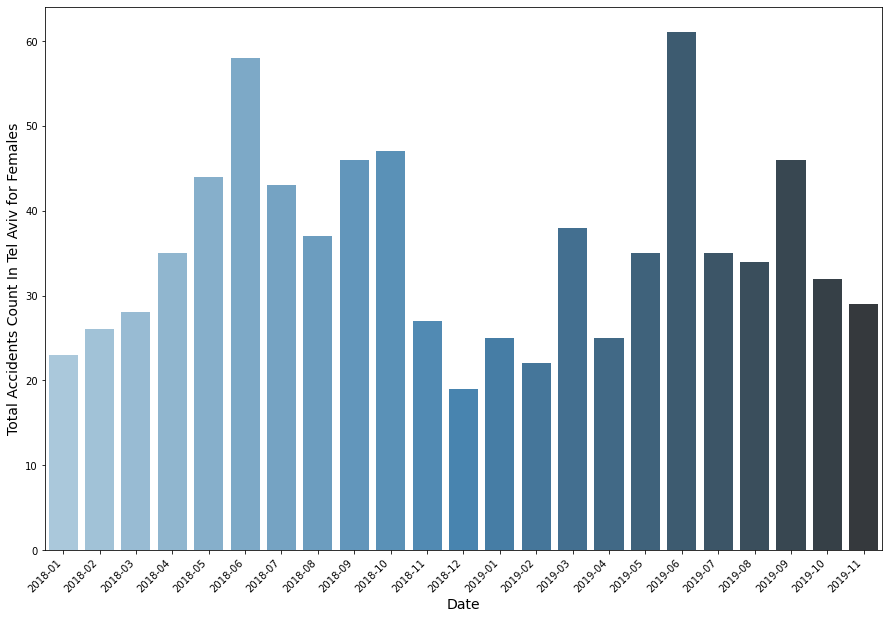

In [63]:
df = df_main[df_main['accident_region'] != 5]
df = df[df['sex'] == 2]
df = df[['provider_and_id','Year','Month','Day']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'Year':'first','Month':'first','Day':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Count In Tel Aviv for Females"})

df = df.set_index(['Year','Month','Day']).sum(level=[0,1,2]).reset_index()
df = df.sort_values(by=['Year','Month','Day']).reset_index(drop=True)
df["Date"] = pd.to_datetime(df[['Year', 'Month', 'Day',]],format='%Y%m%d')

fig, ax = plt.subplots(figsize = (15,10))
fig = sns.lineplot(x='Date', y='Total Accidents Count In Tel Aviv for Females', data=df, ax=ax)
fig = sns.barplot(x="Date", y="Total Accidents Count In Tel Aviv for Females", data = df,
                  ax=ax, palette="Blues_d")
x_dates = df['Date'].dt.strftime('%Y-%m').sort_values().unique()
ax.set_xticklabels(labels=x_dates, rotation=45, ha='right')

### Accidents count over time(Month) for males Outside Tel Aviv

[Text(0, 0, '2018-01'),
 Text(1, 0, '2018-02'),
 Text(2, 0, '2018-03'),
 Text(3, 0, '2018-04'),
 Text(4, 0, '2018-05'),
 Text(5, 0, '2018-06'),
 Text(6, 0, '2018-07'),
 Text(7, 0, '2018-08'),
 Text(8, 0, '2018-09'),
 Text(9, 0, '2018-10'),
 Text(10, 0, '2018-11'),
 Text(11, 0, '2018-12'),
 Text(12, 0, '2019-01'),
 Text(13, 0, '2019-02'),
 Text(14, 0, '2019-03'),
 Text(15, 0, '2019-04'),
 Text(16, 0, '2019-05'),
 Text(17, 0, '2019-06'),
 Text(18, 0, '2019-07'),
 Text(19, 0, '2019-08'),
 Text(20, 0, '2019-09'),
 Text(21, 0, '2019-10'),
 Text(22, 0, '2019-11')]

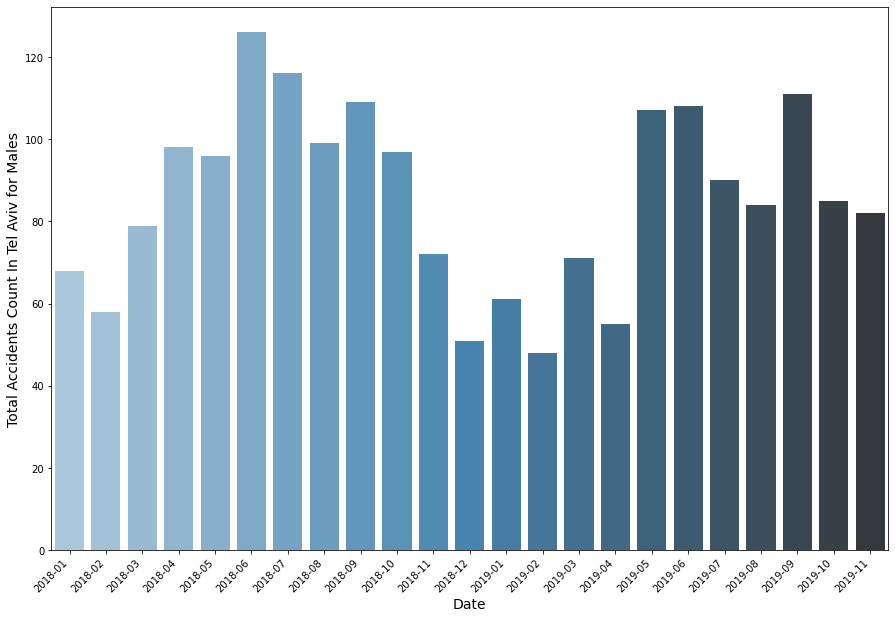

In [65]:
df = df_main[df_main['accident_region'] != 5]
df = df[df['sex'] == 1]
df = df[['provider_and_id','Year','Month','Day']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'Year':'first','Month':'first','Day':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Count In Tel Aviv for Males"})

df = df.set_index(['Year','Month','Day']).sum(level=[0,1,2]).reset_index()
df = df.sort_values(by=['Year','Month','Day']).reset_index(drop=True)
df["Date"] = pd.to_datetime(df[['Year', 'Month', 'Day',]],format='%Y%m%d')

fig, ax = plt.subplots(figsize = (15,10))
fig = sns.lineplot(x='Date', y='Total Accidents Count In Tel Aviv for Males', data=df, ax=ax)
fig = sns.barplot(x="Date", y="Total Accidents Count In Tel Aviv for Males", data = df,
                  ax=ax, palette="Blues_d")
x_dates = df['Date'].dt.strftime('%Y-%m').sort_values().unique()
ax.set_xticklabels(labels=x_dates, rotation=45, ha='right')

### Accidents count over time(Hourly) for females Outside Tel Aviv

[Text(0, 0, '0'),
 Text(1, 0, '1'),
 Text(2, 0, '2'),
 Text(3, 0, '3'),
 Text(4, 0, '5'),
 Text(5, 0, '6'),
 Text(6, 0, '7'),
 Text(7, 0, '8'),
 Text(8, 0, '9'),
 Text(9, 0, '10'),
 Text(10, 0, '11'),
 Text(11, 0, '12'),
 Text(12, 0, '13'),
 Text(13, 0, '14'),
 Text(14, 0, '15'),
 Text(15, 0, '16'),
 Text(16, 0, '17'),
 Text(17, 0, '18'),
 Text(18, 0, '19'),
 Text(19, 0, '20'),
 Text(20, 0, '21'),
 Text(21, 0, '22'),
 Text(22, 0, '23')]

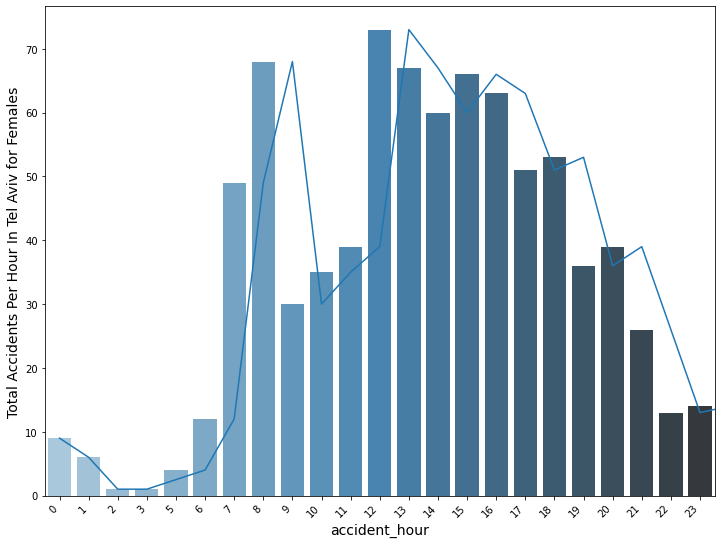

In [68]:
df = df_main[df_main['accident_region'] != 5] # Tel Aviv
df = df[df['sex'] == 2] # Females
df = df[['provider_and_id','accident_hour']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'accident_hour':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Per Hour In Tel Aviv for Females"})

df = df.set_index(['accident_hour']).sum(level=[0]).reset_index()
df = df.sort_values(by=['accident_hour']).reset_index(drop=True)

fig, ax = plt.subplots(figsize = (12,9))
fig = sns.lineplot(x='accident_hour', y='Total Accidents Per Hour In Tel Aviv for Females', data=df, ax=ax)
fig = sns.barplot(x="accident_hour", y="Total Accidents Per Hour In Tel Aviv for Females", data = df,
                  ax=ax, palette="Blues_d")
x_dates = df['accident_hour'].sort_values().unique()
ax.set_xticklabels(labels=x_dates, rotation=45, ha='right')

### Accidents count over time(Hourly) for males Outside Tel Aviv

[Text(0, 0, '0'),
 Text(1, 0, '1'),
 Text(2, 0, '2'),
 Text(3, 0, '3'),
 Text(4, 0, '4'),
 Text(5, 0, '5'),
 Text(6, 0, '6'),
 Text(7, 0, '7'),
 Text(8, 0, '8'),
 Text(9, 0, '9'),
 Text(10, 0, '10'),
 Text(11, 0, '11'),
 Text(12, 0, '12'),
 Text(13, 0, '13'),
 Text(14, 0, '14'),
 Text(15, 0, '15'),
 Text(16, 0, '16'),
 Text(17, 0, '17'),
 Text(18, 0, '18'),
 Text(19, 0, '19'),
 Text(20, 0, '20'),
 Text(21, 0, '21'),
 Text(22, 0, '22'),
 Text(23, 0, '23')]

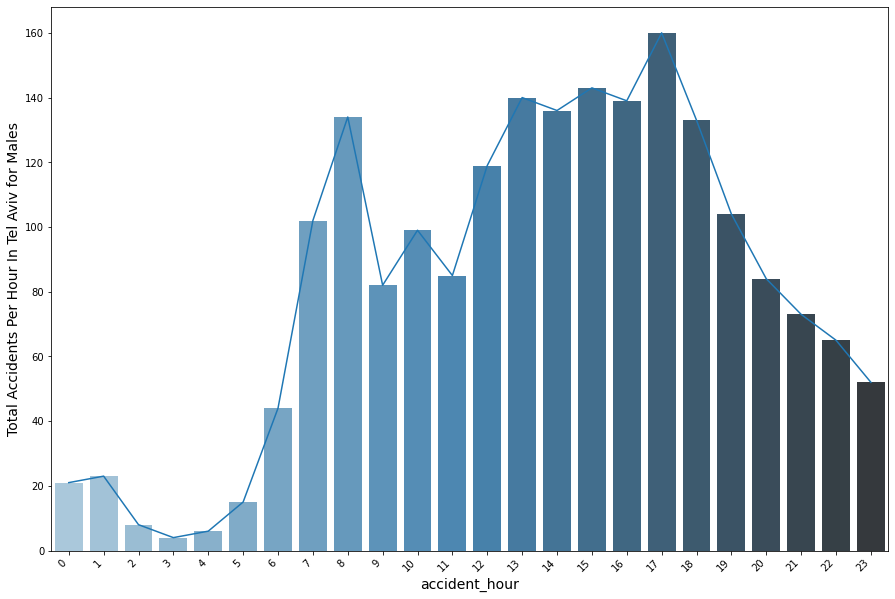

In [69]:
df = df_main[df_main['accident_region'] != 5] # Tel Aviv
df = df[df['sex'] == 1] # Males
df = df[['provider_and_id','accident_hour']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'accident_hour':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Per Hour In Tel Aviv for Males"})

df = df.set_index(['accident_hour']).sum(level=[0]).reset_index()
df = df.sort_values(by=['accident_hour']).reset_index(drop=True)

fig, ax = plt.subplots(figsize = (15,10))
fig = sns.lineplot(x='accident_hour', y='Total Accidents Per Hour In Tel Aviv for Males', data=df, ax=ax)
fig = sns.barplot(x="accident_hour", y="Total Accidents Per Hour In Tel Aviv for Males", data = df,
                  ax=ax, palette="Blues_d")
x_dates = df['accident_hour'].sort_values().unique()
ax.set_xticklabels(labels=x_dates, rotation=45, ha='right')

### Age

In [14]:
# age by gender
df = df_main[df_main['accident_region'] != 5] # Tel Aviv

# we take only accidents with full gender data
indecies = df['sex_hebrew'].isna()
p_and_id = df[indecies]['provider_and_id'].to_numpy()
df_gender = df[df['provider_and_id'].map(lambda x: x not in p_and_id)]

df1 = df_gender[df_gender['sex'] == 1] # male
Title = "Age of male"
PlotPiechart(df1['age_group_hebrew'].values, df1, 'Age')

df2 = df_gender[df_gender['sex'] == 2] # female
Title = "Age of female"
PlotPiechart(df2['age_group_hebrew'].values, df2, 'Age')

In [71]:
# age by gender
df = df_main[df_main['accident_region'] != 5] 

# we take only accidents with full gender data
indecies = df['sex_hebrew'].isna()
p_and_id = df[indecies]['provider_and_id'].to_numpy()
df_gender = df[df['provider_and_id'].map(lambda x: x not in p_and_id)]

df1 = df_gender[df_gender['sex'] == 1] # male
df_male_age = df1['age_group'].values

# age by gender
df = df_main[df_main['accident_region'] != 5] 

# we take only accidents with full gender data
indecies = df['sex_hebrew'].isna()
p_and_id = df[indecies]['provider_and_id'].to_numpy()
df_gender = df[df['provider_and_id'].map(lambda x: x not in p_and_id)]

df1 = df_gender[df_gender['sex'] == 2] # female
df_female_age = df1['age_group'].values

from scipy.stats import ttest_ind

male_mean = np.mean(df_male_age)
female_mean = np.mean(df_female_age)
print("male mean value:",male_mean)
print("female mean value:",female_mean)
male_std = np.std(df_male_age)
female_std = np.std(df_female_age)
print("man std value:",male_std)
print("female std value:",female_std)
ttest,pval = ttest_ind(df_male_age,df_female_age)
print("p-value",pval)
if pval <0.05:
  print("we reject null hypothesis")
else:
  print("we accept null hypothesis")

male mean value: 8.250557289344627
female mean value: 8.6071964017991
man std value: 4.33686243132963
female std value: 3.5595355089375564
p-value 0.05273950567245875
we accept null hypothesis


### Map

In [15]:
import plotly.express as px
df = df_main
fig = px.scatter_mapbox(df, lat="latitude", lon="longitude", hover_name="accident_yishuv_name", hover_data=["street1_hebrew", "involve_vehicle_type_hebrew", "accident_timestamp"],
                        color_discrete_sequence=["crimson"], zoom=3, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## Year Comparison




### Total count of accidents

In [16]:
f = df_main
df = df[df['Year'] == 2018]
df = df[['provider_and_id']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1})
print("Total count of accidents in 2018 = {}".format(len(df.index)))
df = df_main
df = df[df['Year'] == 2019]
df = df[['provider_and_id']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1})
print("Total count of accidents in 2019 = {}".format(len(df.index)))

Total count of accidents in 2018 = 2029
Total count of accidents in 2019 = 1829


### Pedestrians injured

In [76]:
df = df_main
df = df[df['Year'] == 2018]
df = df[df['injured_type'] == 1]
print("number of pedestrians injured in 2018 = {}".format(len(df.index)))
df = df_main
df = df[df['Year'] == 2019]
df = df[df['injured_type'] == 1]
print("number of pedestrians injured in 2019 = {}".format(len(df.index)))

number of pedestrians injured in 2018 = 215
number of pedestrians injured in 2019 = 193


## Year 2019 there are less accidents than year 2018 !

### Accidents count over time(Hourly) For 2018/19 separately

In [77]:
df = df_main
df = df[df['Year'] == 2018]
df = df[['provider_and_id','accident_hour']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'accident_hour':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Per Hour"})
df = df.set_index(['accident_hour']).sum(level=[0]).reset_index()
df = df.sort_values(by=['accident_hour']).reset_index(drop=True)

# 0 for day, 1 for night
df['Time'] = (df['accident_hour']>=20) | (df['accident_hour']<=5)
df = df.groupby(df['Time']).aggregate({'accident_hour':'first','Total Accidents Per Hour':'sum'})
df = df.rename(columns={"Total Accidents Per Hour":"Total Accidents per Part of the day"})
df = df.reset_index()

df['%'] = df['Total Accidents per Part of the day']/df['Total Accidents per Part of the day'].sum() *100

print("For 2018:")
print(df)

df = df_main
df = df[df['Year'] == 2019]
df = df[['provider_and_id','accident_hour']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'accident_hour':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Per Hour"})
df = df.set_index(['accident_hour']).sum(level=[0]).reset_index()
df = df.sort_values(by=['accident_hour']).reset_index(drop=True)

# 0 for day, 1 for night
df['Time'] = (df['accident_hour']>=20) | (df['accident_hour']<=5)
df = df.groupby(df['Time']).aggregate({'accident_hour':'first','Total Accidents Per Hour':'sum'})
df = df.rename(columns={"Total Accidents Per Hour":"Total Accidents per Part of the day"})
df = df.reset_index()

df['%'] = df['Total Accidents per Part of the day']/df['Total Accidents per Part of the day'].sum() *100

print("For 2019:")
print(df)

For 2018:
    Time  accident_hour  Total Accidents per Part of the day          %
0  False              6                                 1647  81.172992
1   True              0                                  382  18.827008
For 2019:
    Time  accident_hour  Total Accidents per Part of the day          %
0  False              6                                 1507  82.394751
1   True              0                                  322  17.605249


## Junction




### Number of accidents in a Junction (And in Tel Aviv vs Outside)

In [17]:
df = df_main[df_main['accident_region'] == 5] # Tel Aviv

Title = "Percentage of Accident happened In a Junction In Tel Aviv"
PlotPiechart(df['road_type_hebrew'].values, df, 'Junction')

df = df_main[df_main['accident_region'] != 5] # Outside

Title = "Percentage of Accident happened In a Junction Outside Tel Aviv"
PlotPiechart(df['road_type_hebrew'].values, df, 'Junction')

[Text(0, 0, '0'),
 Text(1, 0, '1'),
 Text(2, 0, '2'),
 Text(3, 0, '4'),
 Text(4, 0, '5'),
 Text(5, 0, '6'),
 Text(6, 0, '7'),
 Text(7, 0, '8'),
 Text(8, 0, '9'),
 Text(9, 0, '10'),
 Text(10, 0, '11'),
 Text(11, 0, '12'),
 Text(12, 0, '13'),
 Text(13, 0, '14'),
 Text(14, 0, '15'),
 Text(15, 0, '16'),
 Text(16, 0, '17'),
 Text(17, 0, '18'),
 Text(18, 0, '19'),
 Text(19, 0, '20'),
 Text(20, 0, '21'),
 Text(21, 0, '22'),
 Text(22, 0, '23')]

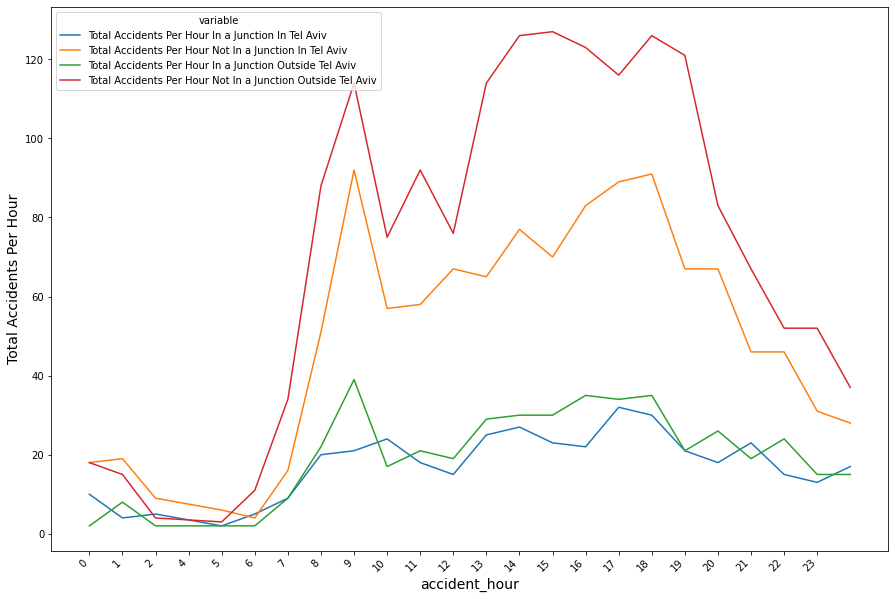

In [81]:
# Graph of number of accidents vs time. with line of junction vs not junction. and tel aviv vs outside.

df = df_main[df_main['accident_region'] == 5] # Tel Aviv
df = df[df['road_type'] == 1] # Junction, Urban
df = df[['provider_and_id','accident_hour']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'accident_hour':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Per Hour In a Junction In Tel Aviv"})
df = df.set_index(['accident_hour']).sum(level=[0]).reset_index()
df_junction_tel_aviv = df.sort_values(by=['accident_hour']).reset_index(drop=True)

df = df_main[df_main['accident_region'] == 5] # Tel Aviv
df = df[df['road_type'] == 2] # Not Junction, Urban
df = df[['provider_and_id','accident_hour']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'accident_hour':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Per Hour Not In a Junction In Tel Aviv"})
df = df.set_index(['accident_hour']).sum(level=[0]).reset_index()
df_not_junction_tel_aviv = df.sort_values(by=['accident_hour']).reset_index(drop=True)

df = df_main[df_main['accident_region'] != 5] # Outside Tel Aviv
df = df[df['road_type'] == 1] # Junction, Urban
df = df[['provider_and_id','accident_hour']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'accident_hour':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Per Hour In a Junction Outside Tel Aviv"})
df = df.set_index(['accident_hour']).sum(level=[0]).reset_index()
df_junction_outside = df.sort_values(by=['accident_hour']).reset_index(drop=True)

df = df_main[df_main['accident_region'] != 5] # Outside Tel Aviv
df = df[df['road_type'] == 2] # Not Junction, Urban
df = df[['provider_and_id','accident_hour']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'accident_hour':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Per Hour Not In a Junction Outside Tel Aviv"})
df = df.set_index(['accident_hour']).sum(level=[0]).reset_index()
df_not_junction_outside = df.sort_values(by=['accident_hour']).reset_index(drop=True)

dfs = [df_junction_tel_aviv, df_not_junction_tel_aviv, df_junction_outside, df_not_junction_outside]

from functools import reduce
df_all = reduce(lambda left,right: pd.merge(left,right,on='accident_hour'), dfs)

# with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
#     print(pd.melt(df_all, ['accident_hour']))

fig, ax = plt.subplots(figsize = (15,10))
fig = sns.lineplot(x='accident_hour', y='Total Accidents Per Hour', hue='variable', ax=ax,
             data=pd.melt(df_all, ['accident_hour'], value_name='Total Accidents Per Hour'))
x_dates = df_all['accident_hour'].sort_values().unique()
ax.set_xticks(np.arange(len(x_dates)))
ax.set_xticklabels(labels=x_dates, rotation=45, ha='right')

Total number of accident in junction < Total number of accident in a not in junction 

6 - 9 am accidents rises exponentially ! 

3-7 pm there are high number of accident 

## Gender Comparison








### Accidents count over time(Hourly) for Males and Females (And in Tel Aviv vs Outside)

[Text(0, 0, '0'),
 Text(1, 0, '1'),
 Text(2, 0, '2'),
 Text(3, 0, '3'),
 Text(4, 0, '5'),
 Text(5, 0, '6'),
 Text(6, 0, '7'),
 Text(7, 0, '8'),
 Text(8, 0, '9'),
 Text(9, 0, '10'),
 Text(10, 0, '11'),
 Text(11, 0, '12'),
 Text(12, 0, '13'),
 Text(13, 0, '14'),
 Text(14, 0, '15'),
 Text(15, 0, '16'),
 Text(16, 0, '17'),
 Text(17, 0, '18'),
 Text(18, 0, '19'),
 Text(19, 0, '20'),
 Text(20, 0, '21'),
 Text(21, 0, '22'),
 Text(22, 0, '23')]

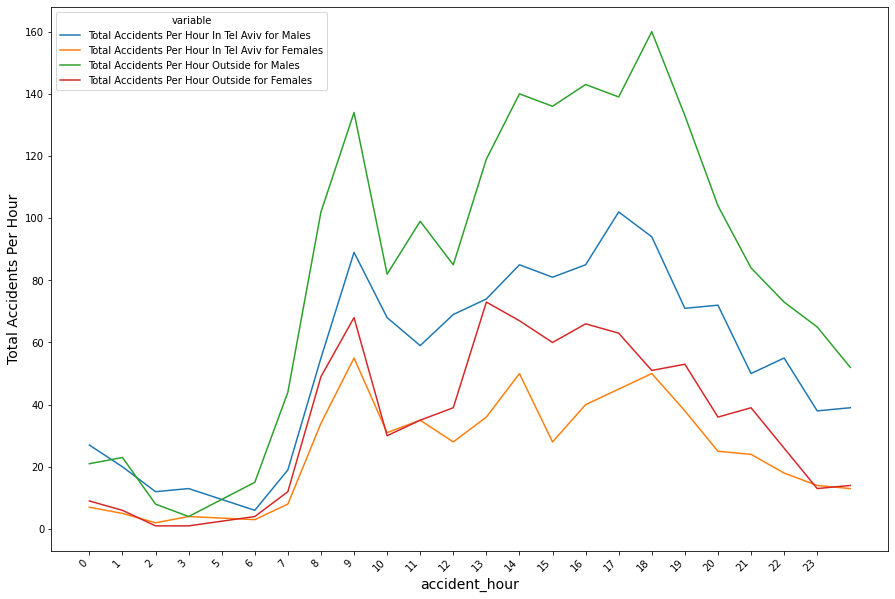

In [82]:
df = df_main[df_main['accident_region'] == 5] # Tel Aviv
df = df[df['sex'] == 1] # males
df = df[['provider_and_id','accident_hour']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'accident_hour':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Per Hour In Tel Aviv for Males"})
df = df.set_index(['accident_hour']).sum(level=[0]).reset_index()
df_male_tel_aviv = df.sort_values(by=['accident_hour']).reset_index(drop=True)

df = df_main[df_main['accident_region'] == 5] # Tel Aviv
df = df[df['sex'] == 2] # Females
df = df[['provider_and_id','accident_hour']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'accident_hour':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Per Hour In Tel Aviv for Females"})
df = df.set_index(['accident_hour']).sum(level=[0]).reset_index()
df_female_tel_aviv = df.sort_values(by=['accident_hour']).reset_index(drop=True)

df = df_main[df_main['accident_region'] != 5] # Outside Tel Aviv
df = df[df['sex'] == 1] # males
df = df[['provider_and_id','accident_hour']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'accident_hour':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Per Hour Outside for Males"})
df = df.set_index(['accident_hour']).sum(level=[0]).reset_index()
df_male_outside = df.sort_values(by=['accident_hour']).reset_index(drop=True)

df = df_main[df_main['accident_region'] != 5] # Outside Tel Aviv
df = df[df['sex'] == 2] # Females
df = df[['provider_and_id','accident_hour']]
df = df.groupby(df['provider_and_id']).aggregate({'provider_and_id':lambda x: 1,'accident_hour':'first'})
df = df.rename(columns={"provider_and_id":"Total Accidents Per Hour Outside for Females"})
df = df.set_index(['accident_hour']).sum(level=[0]).reset_index()
df_female_outside = df.sort_values(by=['accident_hour']).reset_index(drop=True)

dfs = [df_male_tel_aviv, df_female_tel_aviv, df_male_outside, df_female_outside]

from functools import reduce
df_all = reduce(lambda left,right: pd.merge(left,right,on='accident_hour'), dfs)

# with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
#     print(pd.melt(df_all, ['accident_hour']))

fig, ax = plt.subplots(figsize = (15,10))
fig = sns.lineplot(x='accident_hour', y='Total Accidents Per Hour', hue='variable', ax=ax,
             data=pd.melt(df_all, ['accident_hour'], value_name='Total Accidents Per Hour'))
x_dates = df_all['accident_hour'].sort_values().unique()
ax.set_xticks(np.arange(len(x_dates)))
ax.set_xticklabels(labels=x_dates, rotation=45, ha='right')

Males are more involved in accidents !

Females outside Tel Aviv are more involved in accidents than the females in Tel Aviv ! Same cases for males too !


### Age

In [18]:
df_tel_aviv = df_main[df_main['accident_region'] == 5] # Tel Aviv
df = df_tel_aviv[df_tel_aviv['sex'] == 1] # male
Title = "Age of male"
PlotPiechart(df['age_group_hebrew'].values, df, 'Age')
df = df_tel_aviv[df_tel_aviv['sex'] == 2] # female
Title = "Age of female"
PlotPiechart(df['age_group_hebrew'].values, df, 'Age')

## Accident severity for age and gender

### Age, severity and gender

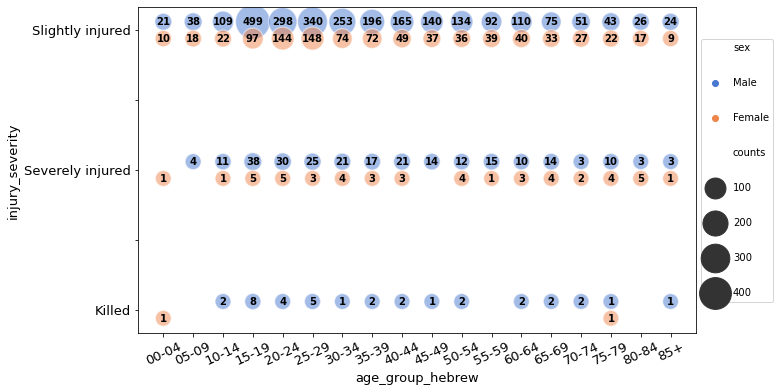

In [84]:
df = df_main[['age_group_hebrew', 'sex', 'injury_severity']]
df = df[df['injury_severity']!=0]
df = df[df['age_group_hebrew']!='לא ידוע']
df = df.dropna().reset_index(drop=True)
df = df.groupby(df.columns.tolist()).size().reset_index().rename(columns={0:'counts'})

df['injury_severity'] = np.where(df['sex']==1.0, df['injury_severity']+0.06, df['injury_severity'])
df['injury_severity'] = np.where(df['sex']==2.0, df['injury_severity']-0.06, df['injury_severity'])

df['sex'] = np.where(df['sex']==1.0, 'Male', 'Female')

fig, ax = plt.subplots(figsize = (10,6))  
fig = sns.scatterplot(x="age_group_hebrew", y="injury_severity", hue="sex", size="counts",
            sizes=(250, 1200), alpha=.5, palette="muted",
            data=df, ax=ax)
for tick in ax.get_xticklabels():
    tick.set_rotation(25)
fig.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), ncol=1, labelspacing=2.5)
for line in df.index:
    ax.text(df.age_group_hebrew[line], df.injury_severity[line], df.counts[line], ha='center', va='center', size='medium',
            color='black', weight='semibold')
    
labels = [item.get_text() for item in ax.get_yticklabels()]
labels[5] = 'Slightly injured'
labels[3] = 'Severely injured'
labels[1] = 'Killed'
ax.set_yticklabels(labels)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(13)

In [ ]:
## Road Type and Day/Night to Injury Severity Sneaky Diagram

In [19]:
# https://medium.com/kenlok/how-to-create-sankey-diagrams-from-dataframes-in-python-e221c1b4d6b0

def genSankey(df,cat_cols=[],value_cols='',title='Sankey Diagram'):
    # maximum of 6 value cols -> 6 colors
    colorPalette = ['#4B8BBE','#306998','#FFE873','#FFD43B','#646464']
    labelList = []
    colorNumList = []
    for catCol in cat_cols:
        labelListTemp =  list(set(df[catCol].values))
        colorNumList.append(len(labelListTemp))
        labelList = labelList + labelListTemp
        
    # remove duplicates from labelList
    labelList = list(dict.fromkeys(labelList))
    
    # define colors based on number of levels
    colorList = []
    for idx, colorNum in enumerate(colorNumList):
        colorList = colorList + [colorPalette[idx]]*colorNum
        
    # transform df into a source-target pair
    for i in range(len(cat_cols)-1):
        if i==0:
            sourceTargetDf = df[[cat_cols[i],cat_cols[i+1],value_cols]]
            sourceTargetDf.columns = ['source','target','count']
        else:
            tempDf = df[[cat_cols[i],cat_cols[i+1],value_cols]]
            tempDf.columns = ['source','target','count']
            sourceTargetDf = pd.concat([sourceTargetDf,tempDf])
        sourceTargetDf = sourceTargetDf.groupby(['source','target']).agg({'count':'sum'}).reset_index()
        
    # add index for source-target pair
    sourceTargetDf['sourceID'] = sourceTargetDf['source'].apply(lambda x: labelList.index(x))
    sourceTargetDf['targetID'] = sourceTargetDf['target'].apply(lambda x: labelList.index(x))
    
    # creating the sankey diagram
    data = dict(
        type='sankey',
        node = dict(
          pad = 15,
          thickness = 20,
          line = dict(
            color = "black",
            width = 0.5
          ),
          label = labelList,
          color = colorList
        ),
        link = dict(
          source = sourceTargetDf['sourceID'],
          target = sourceTargetDf['targetID'],
          value = sourceTargetDf['count']
        )
      )
    
    layout =  dict(
        title = title,
        font = dict(
          size = 10
        )
    )
       
    fig = dict(data=[data], layout=layout)
    return fig


df = df_main
df = df[['road_type_hebrew', 'day_night_hebrew','injury_severity_hebrew']]
df = df.dropna()
cols = ['road_type_hebrew', 'day_night_hebrew']
df['lvl1'] = df[cols].apply(lambda row: ' ו-'.join(row.values.astype(str)), axis=1)
df['lvl2'] = df['injury_severity_hebrew']
df['count'] = 1

df = df[['lvl1','lvl2','count']]

df['lvl1']= df.loc[:,'lvl1'].apply(lambda x: x[::-1])
df['lvl2']= df.loc[:,'lvl2'].apply(lambda x: x[::-1])

fig = genSankey(df,cat_cols=['lvl1','lvl2'],value_cols='count',title='Road Type and Day/Night to Injury Severity Sneaky Diagram')
plty.iplot(fig)

### Sankey diagram
 Sankey diagrams are a type of flow diagram in which the width of the arrows is proportional to the flow rate. 